In [1]:
from statsmodels.regression.rolling import RollingOLS
import pandas_datareader.data as web
import matplotlib.pyplot as plt
import statsmodels.api as sm
import pandas as pd
import numpy as np
import datetime as dt
import yfinance as yf
import pandas_ta
import warnings
warnings.filterwarnings('ignore')  

# statsmodels.regression.rolling: Importing the RollingOLS class for rolling linear regression.
# pandas_datareader.data: Importing the web module from pandas_datareader for fetching financial data.
# matplotlib.pyplot: Importing the pyplot module for plotting.
# statsmodels.api: Importing the statsmodels library for statistical models and tests.
# pandas: Importing the pandas library for data manipulation and analysis.
# numpy: Importing the numpy library for numerical operations.
# datetime: Importing the datetime module for working with dates.
# yfinance: Importing the yfinance library for fetching financial data from Yahoo Finance.
# pandas_ta: Importing the pandas_ta library for technical analysis.
# warnings: Importing the warnings module to suppress warnings.

# getting the data 
nifty50 = pd.read_csv("ind_nifty500list.csv")
symbols_list = nifty50['Symbol'].unique().tolist()

# Add '.NS' to each ticker symbol in the list
symbols_list = [ticker + '.NS' for ticker in symbols_list]

# Display the modified list
print(symbols_list)


end_date = '2024-03-02'

start_date = pd.to_datetime(end_date)-pd.DateOffset(365*8)

# Setting start and end dates:
# Defining the end_date as '2023-12-03'.
# Calculating the start_date as 8 years (365 days * 8) before the end_date.capitalize

df = yf.download(tickers=symbols_list,
                 start=start_date,
                 end=end_date).stack()

df.index.names = ['date', 'ticker']

df.columns = df.columns.str.lower()

df

['360ONE.NS', '3MINDIA.NS', 'ABB.NS', 'ACC.NS', 'AIAENG.NS', 'APLAPOLLO.NS', 'AUBANK.NS', 'AARTIDRUGS.NS', 'AARTIIND.NS', 'AAVAS.NS', 'ABBOTINDIA.NS', 'ADANIENSOL.NS', 'ADANIENT.NS', 'ADANIGREEN.NS', 'ADANIPORTS.NS', 'ADANIPOWER.NS', 'ATGL.NS', 'AWL.NS', 'ABCAPITAL.NS', 'ABFRL.NS', 'AEGISCHEM.NS', 'AETHER.NS', 'AFFLE.NS', 'AJANTPHARM.NS', 'APLLTD.NS', 'ALKEM.NS', 'ALKYLAMINE.NS', 'ALLCARGO.NS', 'ALOKINDS.NS', 'ARE&M.NS', 'AMBER.NS', 'AMBUJACEM.NS', 'ANGELONE.NS', 'ANURAS.NS', 'APARINDS.NS', 'APOLLOHOSP.NS', 'APOLLOTYRE.NS', 'APTUS.NS', 'ACI.NS', 'ASAHIINDIA.NS', 'ASHOKLEY.NS', 'ASIANPAINT.NS', 'ASTERDM.NS', 'ASTRAL.NS', 'ATUL.NS', 'AUROPHARMA.NS', 'AVANTIFEED.NS', 'DMART.NS', 'AXISBANK.NS', 'BEML.NS', 'BLS.NS', 'BSE.NS', 'BAJAJ-AUTO.NS', 'BAJFINANCE.NS', 'BAJAJFINSV.NS', 'BAJAJHLDNG.NS', 'BALAMINES.NS', 'BALKRISIND.NS', 'BALRAMCHIN.NS', 'BANDHANBNK.NS', 'BANKBARODA.NS', 'BANKINDIA.NS', 'MAHABANK.NS', 'BATAINDIA.NS', 'BAYERCROP.NS', 'BERGEPAINT.NS', 'BDL.NS', 'BEL.NS', 'BHARATFORG.NS', 

adj close         close          high  \
date       ticker                                                    
2016-03-04 3MINDIA.NS     10367.291992  10781.000000  10900.000000   
           AARTIDRUGS.NS    119.222282    122.262497    124.500000   
           AARTIIND.NS      114.708687    118.447540    120.877480   
           ABB.NS          1005.350647   1037.183228   1048.168213   
           ABBOTINDIA.NS   4822.140137   5063.700195   5240.049805   
...                                ...           ...           ...   
2024-03-01 ZENSARTECH.NS    544.349976    544.349976    557.700012   
           ZFCVINDIA.NS   14827.750000  14827.750000  14895.000000   
           ZOMATO.NS        166.500000    166.500000    173.500000   
           ZYDUSLIFE.NS     925.349976    925.349976    948.349976   
           ZYDUSWELL.NS    1565.800049   1565.800049   1575.250000   

                                   low          open      volume  
date       ticker                                                 
2016-03-04 3MINDIA.NS     10470.000000  10800.000000       784.0  
           AARTIDRUGS.NS    120.425003    121.500000     34384.0  
           AARTIIND.NS      116.637230    116.637230    109352.0  
           ABB.NS           958.426453    984.118835    231074.0  
           ABBOTINDIA.NS   5039.700195   5110.000000      3461.0  
...                                ...           ...         ...  
2024-03-01 ZENSARTECH.NS    542.000000    553.000000    379961.0  
           ZFCVINDIA.NS   14514.049805  14626.549805      2567.0  
           ZOMATO.NS        165.600006    168.000000  42587331.0  
           ZYDUSLIFE.NS     923.599976    948.349976   1099628.0  
           ZYDUSWELL.NS    1555.000000   1572.199951     20843.0  

[852162 rows x 6 columns]

### Calculate features and technical indicators

* Garman -klass volatilit
* RSI
* Bollinger Bands
* ATR
* MACD
* Dollar Volume

In [2]:
df['garman_klass_vol'] = ((np.log(df['high'])-np.log(df['low']))**2)/2-(2*np.log(2)-1)*((np.log(df['adj close'])-np.log(df['open']))**2)

# df: This is the DataFrame on which the grouping operation is applied.

# .groupby(level=1): This is a method provided by pandas for grouping data based on one or more levels of a multi-level index. In this case, it's specifying to group the DataFrame by the second level of its index.

# The index of df has two levels ('date' and 'ticker'). By specifying level=1, the grouping is done based on the 'ticker' level. This means that the DataFrame will be split into groups, each corresponding to a unique 'ticker' in the second level of the index.

df['rsi'] = df.groupby(level=1)['adj close'].transform(lambda x: pandas_ta.rsi(close=x, length=20))

df['bb_low'] = df.groupby(level=1)['adj close'].transform(lambda x: pandas_ta.bbands(close=np.log1p(x), length=20).iloc[:,0])
                                                          
df['bb_mid'] = df.groupby(level=1)['adj close'].transform(lambda x: pandas_ta.bbands(close=np.log1p(x), length=20).iloc[:,1])
                                                          
df['bb_high'] = df.groupby(level=1)['adj close'].transform(lambda x: pandas_ta.bbands(close=np.log1p(x), length=20).iloc[:,2])

def compute_atr(stock_data):
    atr = pandas_ta.atr(high=stock_data['high'],
                        low=stock_data['low'],
                        close=stock_data['close'],
                        length=14)
    return atr.sub(atr.mean()).div(atr.std())

df['atr'] = df.groupby(level=1, group_keys=False).apply(compute_atr)

def compute_macd(close):
    macd = pandas_ta.macd(close=close, length=20).iloc[:,0]
    return macd.sub(macd.mean()).div(macd.std())

df['macd'] = df.groupby(level=1, group_keys=False)['adj close'].apply(compute_macd)

df['dollar_volume'] = (df['adj close']*df['volume'])/1e6

# 1e6 is a shorthand notation in Python for expressing the number 1 followed by 6 zeros, which is equivalent to 1,000,000. It is often used to represent one million in a more concise form.

df

adj close         close          high  \
date       ticker                                                    
2016-03-04 3MINDIA.NS     10367.291992  10781.000000  10900.000000   
           AARTIDRUGS.NS    119.222282    122.262497    124.500000   
           AARTIIND.NS      114.708687    118.447540    120.877480   
           ABB.NS          1005.350647   1037.183228   1048.168213   
           ABBOTINDIA.NS   4822.140137   5063.700195   5240.049805   
...                                ...           ...           ...   
2024-03-01 ZENSARTECH.NS    544.349976    544.349976    557.700012   
           ZFCVINDIA.NS   14827.750000  14827.750000  14895.000000   
           ZOMATO.NS        166.500000    166.500000    173.500000   
           ZYDUSLIFE.NS     925.349976    925.349976    948.349976   
           ZYDUSWELL.NS    1565.800049   1565.800049   1575.250000   

                                   low          open      volume  \
date       ticker                                                  
2016-03-04 3MINDIA.NS     10470.000000  10800.000000       784.0   
           AARTIDRUGS.NS    120.425003    121.500000     34384.0   
           AARTIIND.NS      116.637230    116.637230    109352.0   
           ABB.NS           958.426453    984.118835    231074.0   
           ABBOTINDIA.NS   5039.700195   5110.000000      3461.0   
...                                ...           ...         ...   
2024-03-01 ZENSARTECH.NS    542.000000    553.000000    379961.0   
           ZFCVINDIA.NS   14514.049805  14626.549805      2567.0   
           ZOMATO.NS        165.600006    168.000000  42587331.0   
           ZYDUSLIFE.NS     923.599976    948.349976   1099628.0   
           ZYDUSWELL.NS    1555.000000   1572.199951     20843.0   

                          garman_klass_vol        rsi    bb_low    bb_mid  \
date       ticker                                                           
2016-03-04 3MINDIA.NS             0.000164        NaN       NaN       NaN   
           AARTIDRUGS.NS          0.000415        NaN       NaN       NaN   
           AARTIIND.NS            0.000530        NaN       NaN       NaN   
           ABB.NS                 0.003830        NaN       NaN       NaN   
           ABBOTINDIA.NS         -0.000539        NaN       NaN       NaN   
...                                    ...        ...       ...       ...   
2024-03-01 ZENSARTECH.NS          0.000312  47.956963  6.227294  6.303624   
           ZFCVINDIA.NS           0.000264  45.660255  9.551111  9.596274   
           ZOMATO.NS              0.001055  69.611808  4.941782  5.050526   
           ZYDUSLIFE.NS           0.000117  75.600481  6.644969  6.774442   
           ZYDUSWELL.NS           0.000077  42.379249  7.351581  7.373139   

                           bb_high       atr      macd  dollar_volume  
date       ticker                                                      
2016-03-04 3MINDIA.NS          NaN       NaN       NaN       8.127957  
           AARTIDRUGS.NS       NaN       NaN       NaN       4.099339  
           AARTIIND.NS         NaN       NaN       NaN      12.543624  
           ABB.NS              NaN       NaN       NaN     232.310395  
           ABBOTINDIA.NS       NaN       NaN       NaN      16.689427  
...                            ...       ...       ...            ...  
2024-03-01 ZENSARTECH.NS  6.379954  1.176663 -0.851322     206.831761  
           ZFCVINDIA.NS   9.641437  3.207386 -2.398859      38.062834  
           ZOMATO.NS      5.159271  1.483427  2.027375    7090.790611  
           ZYDUSLIFE.NS   6.903915  3.112305  4.827154    1017.540743  
           ZYDUSWELL.NS   7.394696 -0.790893 -0.461478      32.635970  

[852162 rows x 14 columns]

In [3]:
import pandas as pd

# Read HTML tables from the Wikipedia page
tables = pd.read_html('https://en.wikipedia.org/wiki/NIFTY_500#Other_Notable_Indices', header=0)

# Print the number of tables found
print(f"Number of tables found: {len(tables)}")

# Print the columns of each table to understand their structure
for i, table in enumerate(tables):
    print(f"Table {i} columns:\n{table.columns}\n{'='*50}")

# Check if the list has an element at the expected index
if len(tables) > 4:
    nifty50 = tables[4]
    # Ensure the 'Symbol' column is present in the DataFrame
    if 'Symbol' in nifty50.columns:
        symbols_list = nifty50['Symbol'].unique().tolist()
        # Add '.NS' to each ticker symbol in the list
        symbols_list = [ticker + '.NS' for ticker in symbols_list]
        print("Symbols List:", symbols_list)
    else:
        print("Error: 'Symbol' column not found in the DataFrame.")
else:
    print("Error: List index out of range.")


Number of tables found: 3
Table 0 columns:
Index(['Unnamed: 0', 'Unnamed: 1'], dtype='object')
Table 1 columns:
Index(['Category', 'All-time highs[5]', 'All-time highs[5].1'], dtype='object')
Table 2 columns:
Index(['Sl.No', 'Company Name', 'Industry', 'Symbol', 'Series', 'ISIN Code'], dtype='object')
Error: List index out of range.


# Taking First 30 Companies beacuse also listed in Sensex

## Getting monthly index and average dollar volume and making it multiindex

In [4]:
last_cols =[c for c in df.columns.unique(0)if c not in['dollar_volume','volume','open','high','low','close']]
# exclude given column and include all the remaining one and store it in last_cols
last_cols
data=pd.concat([df.unstack('ticker')['dollar_volume'].resample('M').mean().stack('ticker').to_frame('dollar_volume'),
# Resamples the 'dollar_volume' column by month, calculates the mean for each month, and then stacks the DataFrame.
#The result is a DataFrame with a MultiIndex containing levels 'date' and 'ticker', with the 'dollar_volume' as a single column.
# The capital M stands for month dollar volume mean is taken             
df.unstack()[last_cols].resample('M').last().stack('ticker')],axis=1).dropna()
# Unstacks the entire DataFrame and selects only the columns specified in last_cols.
# Resamples the resulting DataFrame by month and selects the last value for each month.
data

dollar_volume     adj close  garman_klass_vol  \
date       ticker                                                         
2016-04-30 3MINDIA.NS         42.286763  12812.562500         -0.000917   
           AARTIDRUGS.NS       3.076647    115.435051         -0.000255   
           AARTIIND.NS        11.035640    126.160545         -0.000088   
           ABB.NS            125.499065   1145.042603          0.000834   
           ABBOTINDIA.NS      12.793761   4409.176758         -0.001244   
...                                 ...           ...               ...   
2024-03-31 ZENSARTECH.NS     206.831761    544.349976          0.000312   
           ZFCVINDIA.NS       38.062834  14827.750000          0.000264   
           ZOMATO.NS        7090.790611    166.500000          0.001055   
           ZYDUSLIFE.NS     1017.540743    925.349976          0.000117   
           ZYDUSWELL.NS       32.635970   1565.800049          0.000077   

                                rsi    bb_low    bb_mid   bb_high       atr  \
date       ticker                                                             
2016-04-30 3MINDIA.NS     69.009629  9.145818  9.372928  9.600037 -0.312049   
           AARTIDRUGS.NS  49.667453  4.707565  4.741481  4.775398 -0.975396   
           AARTIIND.NS    57.967671  4.795527  4.836950  4.878373 -1.287266   
           ABB.NS         57.004968  7.001238  7.054706  7.108174 -0.387161   
           ABBOTINDIA.NS  41.084807  8.372018  8.402104  8.432191 -0.949808   
...                             ...       ...       ...       ...       ...   
2024-03-31 ZENSARTECH.NS  47.956963  6.227294  6.303624  6.379954  1.176663   
           ZFCVINDIA.NS   45.660255  9.551111  9.596274  9.641437  3.207386   
           ZOMATO.NS      69.611808  4.941782  5.050526  5.159271  1.483427   
           ZYDUSLIFE.NS   75.600481  6.644969  6.774442  6.903915  3.112305   
           ZYDUSWELL.NS   42.379249  7.351581  7.373139  7.394696 -0.790893   

                              macd  
date       ticker                   
2016-04-30 3MINDIA.NS     1.705830  
           AARTIDRUGS.NS -0.144435  
           AARTIIND.NS    0.111463  
           ABB.NS         0.444931  
           ABBOTINDIA.NS -0.474965  
...                            ...  
2024-03-31 ZENSARTECH.NS -0.851322  
           ZFCVINDIA.NS  -2.398859  
           ZOMATO.NS      2.027375  
           ZYDUSLIFE.NS   4.827154  
           ZYDUSWELL.NS  -0.461478  

[41454 rows x 9 columns]

In [5]:
data['dollar_volume'].unstack('ticker').rolling(5*12).mean()
#This applies a rolling window operation with a window size of 5*12 (60) periods.

ticker,360ONE.NS,3MINDIA.NS,AARTIDRUGS.NS,AARTIIND.NS,AAVAS.NS,ABB.NS,ABBOTINDIA.NS,ABCAPITAL.NS,ABFRL.NS,ACC.NS,...,WESTLIFE.NS,WHIRLPOOL.NS,WIPRO.NS,YESBANK.NS,ZEEL.NS,ZENSARTECH.NS,ZFCVINDIA.NS,ZOMATO.NS,ZYDUSLIFE.NS,ZYDUSWELL.NS
date,,,,,,,,,,,,,,,,,,,,,
2016-04-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-05-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-06-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-07-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-08-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-11-30,NaN,111.858234,224.052039,528.393701,215.816709,516.595481,242.027517,409.683307,523.387367,1396.308210,...,NaN,214.056706,3098.371057,4621.645140,3991.588558,299.016778,70.314206,NaN,1128.933919,69.690066
2023-12-31,NaN,116.835781,227.849233,552.551300,224.074924,535.474415,247.627139,422.394694,529.422738,1412.559069,...,NaN,219.628102,3153.277353,4559.736514,4080.194044,327.920658,72.186236,NaN,1143.318778,70.586961
2024-01-31,NaN,119.071755,231.228135,579.046685,229.949275,549.162191,258.211749,438.298096,550.669322,1428.220557,...,NaN,220.451869,3207.565266,4515.114719,4158.963932,340.912401,74.360892,NaN,1152.560525,71.283736


# make changes here to adjust ticker name in dollar volume 

In [6]:
data['dollar_vol_rank']= (data.groupby('date')['dollar_volume'].rank(ascending=False))
#selecting rows where the 'dollar_vol_rank' is less than 30.
data = data[data['dollar_vol_rank']<500].drop(['dollar_volume','dollar_vol_rank'],axis=1)

In [7]:
data

adj close  garman_klass_vol        rsi    bb_low  \
date       ticker                                                               
2016-04-30 3MINDIA.NS     12812.562500         -0.000917  69.009629  9.145818   
           AARTIDRUGS.NS    115.435051         -0.000255  49.667453  4.707565   
           AARTIIND.NS      126.160545         -0.000088  57.967671  4.795527   
           ABB.NS          1145.042603          0.000834  57.004968  7.001238   
           ABBOTINDIA.NS   4409.176758         -0.001244  41.084807  8.372018   
...                                ...               ...        ...       ...   
2024-03-31 ZENSARTECH.NS    544.349976          0.000312  47.956963  6.227294   
           ZFCVINDIA.NS   14827.750000          0.000264  45.660255  9.551111   
           ZOMATO.NS        166.500000          0.001055  69.611808  4.941782   
           ZYDUSLIFE.NS     925.349976          0.000117  75.600481  6.644969   
           ZYDUSWELL.NS    1565.800049          0.000077  42.379249  7.351581   

                            bb_mid   bb_high       atr      macd  
date       ticker                                                 
2016-04-30 3MINDIA.NS     9.372928  9.600037 -0.312049  1.705830  
           AARTIDRUGS.NS  4.741481  4.775398 -0.975396 -0.144435  
           AARTIIND.NS    4.836950  4.878373 -1.287266  0.111463  
           ABB.NS         7.054706  7.108174 -0.387161  0.444931  
           ABBOTINDIA.NS  8.402104  8.432191 -0.949808 -0.474965  
...                            ...       ...       ...       ...  
2024-03-31 ZENSARTECH.NS  6.303624  6.379954  1.176663 -0.851322  
           ZFCVINDIA.NS   9.596274  9.641437  3.207386 -2.398859  
           ZOMATO.NS      5.050526  5.159271  1.483427  2.027375  
           ZYDUSLIFE.NS   6.774442  6.903915  3.112305  4.827154  
           ZYDUSWELL.NS   7.373139  7.394696 -0.790893 -0.461478  

[41443 rows x 8 columns]

# Calculate Monthly returns for different time horizion features
* TO capture time series dynamics that reflects ,for example,momentum patterns, we compute historical returns using the method .pct_change(lag) that is, returns over various monthly periods as identified by lags

In [8]:
def calculate_returns(df):
    
   
    outlier_cutoff =0.005
    # what is a outlier
    # refer this video 'https://youtu.be/rZJbj2I-_Ek?feature=shared'
    # an outlier helps us to konw irrelevance in data like 9,10,10,11,12,36 so outlier is used and 36 is removed
    lags=[1,2,3,6,9,12]
    for lag in lags:
        df[f'return_{lag}m']=(df['adj close'] #: Creates a new column in the DataFrame for each lag, representing returns over that lag period.
                            .pct_change(lag)  #Calculates the percentage change over the specified lag period.
                            .pipe(lambda x: x.clip(lower=x.quantile(outlier_cutoff),upper=x.quantile(1-outlier_cutoff)))
                            .add(1)
                            .pow(1/lag)
                            .sub(1))
    return df

data = data.groupby(level=1, group_keys=False).apply(calculate_returns).dropna() #Applies the calculate_returns function to each group of the DataFrame, grouping by the second level of the index ('ticker').
# .dropna(): Drops any rows with missing values in the resulting DataFrame.
data

adj close  garman_klass_vol        rsi    bb_low  \
date       ticker                                                               
2017-04-30 3MINDIA.NS     11058.413086         -0.000661  48.441048  9.294411   
           AARTIDRUGS.NS    139.378220          0.001436  42.679175  4.936431   
           AARTIIND.NS      208.145325          0.000134  73.359193  5.175510   
           ABB.NS          1248.023926          0.000089  65.491077  7.027148   
           ABBOTINDIA.NS   4244.037109         -0.000215  41.070968  8.342477   
...                                ...               ...        ...       ...   
2024-03-31 ZENSARTECH.NS    544.349976          0.000312  47.956963  6.227294   
           ZFCVINDIA.NS   14827.750000          0.000264  45.660255  9.551111   
           ZOMATO.NS        166.500000          0.001055  69.611808  4.941782   
           ZYDUSLIFE.NS     925.349976          0.000117  75.600481  6.644969   
           ZYDUSWELL.NS    1565.800049          0.000077  42.379249  7.351581   

                            bb_mid   bb_high       atr      macd  return_1m  \
date       ticker                                                             
2017-04-30 3MINDIA.NS     9.335754  9.377096 -1.674053 -0.080166  -0.005865   
           AARTIDRUGS.NS  4.962417  4.988404 -0.746091 -0.128798  -0.013457   
           AARTIIND.NS    5.247757  5.320004 -1.138944  0.199704   0.146627   
           ABB.NS         7.111245  7.195343 -0.659398  0.592034   0.104754   
           ABBOTINDIA.NS  8.399642  8.456806 -1.121664 -0.499902  -0.047075   
...                            ...       ...       ...       ...        ...   
2024-03-31 ZENSARTECH.NS  6.303624  6.379954  1.176663 -0.851322  -0.009552   
           ZFCVINDIA.NS   9.596274  9.641437  3.207386 -2.398859   0.020910   
           ZOMATO.NS      5.050526  5.159271  1.483427  2.027375   0.006346   
           ZYDUSLIFE.NS   6.774442  6.903915  3.112305  4.827154  -0.017571   
           ZYDUSWELL.NS   7.373139  7.394696 -0.790893 -0.461478  -0.001021   

                          return_2m  return_3m  return_6m  return_9m  \
date       ticker                                                      
2017-04-30 3MINDIA.NS      0.014887  -0.012928  -0.020460  -0.024970   
           AARTIDRUGS.NS  -0.027187  -0.028404  -0.027350   0.007901   
           AARTIIND.NS     0.065393   0.069128   0.024983   0.052259   
           ABB.NS          0.086316   0.088688   0.044469   0.012474   
           ABBOTINDIA.NS  -0.004373   0.001690  -0.020145  -0.005912   
...                             ...        ...        ...        ...   
2024-03-31 ZENSARTECH.NS  -0.024659  -0.036451   0.009093   0.039937   
           ZFCVINDIA.NS   -0.047297  -0.025184  -0.007903   0.022382   
           ZOMATO.NS       0.092301   0.104116   0.085987   0.092576   
           ZYDUSLIFE.NS    0.102853   0.103198   0.070463   0.053748   
           ZYDUSWELL.NS   -0.034902   0.003063  -0.007929   0.008424   

                          return_12m  
date       ticker                     
2017-04-30 3MINDIA.NS      -0.012195  
           AARTIDRUGS.NS    0.015831  
           AARTIIND.NS      0.042606  
           ABB.NS           0.007202  
           ABBOTINDIA.NS   -0.003176  
...                              ...  
2024-03-31 ZENSARTECH.NS    0.059744  
           ZFCVINDIA.NS     0.030018  
           ZOMATO.NS        0.103160  
           ZYDUSLIFE.NS     0.054947  
           ZYDUSWELL.NS     0.007946  

[35460 rows x 14 columns]

## Download Fama-French Factors and Calculate Rolling Factor Betas.
* We will introduce the Fama—French data to estimate the exposure of assets to common risk factors using linear regression.

* The five Fama—French factors, namely market risk, size, value, operating profitability, and investment have been shown empirically to explain asset returns and are commonly used to assess the risk/return profile of portfolios. Hence, it is natural to include past factor exposures as financial features in models.

* We can access the historical factor returns using the pandas-datareader and estimate historical exposures using the RollingOLS rolling linear regression.

### what is fama FRench model?

* but Gene Fama and Kenneth French noticed that small-cap stocks (companies with smaller market capitalizations) tended to outperform large-cap stocks and that companies with a higher book-to-market ratio (value stocks) tended to outperform companies with a lower book-to-market ratio (growth stocks).

* MKt-rf= it tells about market risk
* SMB long on portfolio with small cap stocks and short on portfolio on the large cap stocks
* HML long on portfolio with high book to market ratio and short on portfolio with low book to market ratio (low book to market ratio= companies that will grow eg paytm,ideaforage) high book to market are the value stocks
* Robust minus weak (RMW), which compares the returns of firms with high, or robust, operating profitability
* and those with weak, or low, operating profitability; and conservative minus aggressive (CMA)
* we are comparing the number to usa stock market because no data has been available for indian stock market but the numbers are taken on yearly basis so error is less and numbers remain constant

In [9]:
 factor_data = web.DataReader('F-F_Research_Data_5_Factors_2x3',
                               'famafrench',
                               start='2010')[0].drop('RF',axis=1)
factor_data.index = factor_data.index.to_timestamp()  
factor_data= factor_data.resample('M').last().div(100)
factor_data.index.name = 'date'
factor_data = factor_data.join(data['return_1m']).sort_index()
factor_data

Mkt-RF     SMB     HML     RMW     CMA  return_1m
date       ticker                                                          
2017-04-30 3MINDIA.NS     0.0109  0.0048 -0.0213  0.0190 -0.0160  -0.005865
           AARTIDRUGS.NS  0.0109  0.0048 -0.0213  0.0190 -0.0160  -0.013457
           AARTIIND.NS    0.0109  0.0048 -0.0213  0.0190 -0.0160   0.146627
           ABB.NS         0.0109  0.0048 -0.0213  0.0190 -0.0160   0.104754
           ABBOTINDIA.NS  0.0109  0.0048 -0.0213  0.0190 -0.0160  -0.047075
...                          ...     ...     ...     ...     ...        ...
2024-03-31 ZENSARTECH.NS  0.0283 -0.0116  0.0419  0.0148  0.0118  -0.009552
           ZFCVINDIA.NS   0.0283 -0.0116  0.0419  0.0148  0.0118   0.020910
           ZOMATO.NS      0.0283 -0.0116  0.0419  0.0148  0.0118   0.006346
           ZYDUSLIFE.NS   0.0283 -0.0116  0.0419  0.0148  0.0118  -0.017571
           ZYDUSWELL.NS   0.0283 -0.0116  0.0419  0.0148  0.0118  -0.001021

[35460 rows x 6 columns]

In [10]:
observation = factor_data.groupby(level=1).size()
valid_stocks = observation[observation>=10]
factor_data = factor_data[factor_data.index.get_level_values('ticker').isin(valid_stocks.index)]
factor_data
# Checks if each 'ticker' is in the index of valid stocks obtained in the previous step.
# factor_data[factor_data.index.get_level_values('ticker').isin(valid_stocks.index)]: Filters the DataFrame to include only rows corresponding to valid stocks.

Mkt-RF     SMB     HML     RMW     CMA  return_1m
date       ticker                                                          
2017-04-30 3MINDIA.NS     0.0109  0.0048 -0.0213  0.0190 -0.0160  -0.005865
           AARTIDRUGS.NS  0.0109  0.0048 -0.0213  0.0190 -0.0160  -0.013457
           AARTIIND.NS    0.0109  0.0048 -0.0213  0.0190 -0.0160   0.146627
           ABB.NS         0.0109  0.0048 -0.0213  0.0190 -0.0160   0.104754
           ABBOTINDIA.NS  0.0109  0.0048 -0.0213  0.0190 -0.0160  -0.047075
...                          ...     ...     ...     ...     ...        ...
2024-03-31 ZENSARTECH.NS  0.0283 -0.0116  0.0419  0.0148  0.0118  -0.009552
           ZFCVINDIA.NS   0.0283 -0.0116  0.0419  0.0148  0.0118   0.020910
           ZOMATO.NS      0.0283 -0.0116  0.0419  0.0148  0.0118   0.006346
           ZYDUSLIFE.NS   0.0283 -0.0116  0.0419  0.0148  0.0118  -0.017571
           ZYDUSWELL.NS   0.0283 -0.0116  0.0419  0.0148  0.0118  -0.001021

[35413 rows x 6 columns]

In [11]:
betas =(factor_data.groupby(level=1,
                            group_keys=False)
         .apply(lambda x: RollingOLS(endog=x['return_1m'], 
                                     exog=sm.add_constant(x.drop('return_1m', axis=1)),
                                     window=min(24, x.shape[0]),
                                     min_nobs=len(x.columns)+1)
         .fit(params_only=True)
         .params
         .drop('const', axis=1)))
betas
#the code calculates rolling betas for each stock by applying the RollingOLS model to the 'return_1m' as the dependent variable and the other factors from the factor_data DataFrame as independent variables. The rolling window size is 
# determined by the minimum of 24 and the number of observations available for each stock. The resulting betas DataFrame contains the time-varying beta coefficients for each stock with respect to the specified factors.
# rolling returns gives the average of any stocks that give return for eg market is up 3% than it wont affect rolling return

Mkt-RF       SMB       HML       RMW       CMA
date       ticker                                                         
2017-04-30 3MINDIA.NS          NaN       NaN       NaN       NaN       NaN
           AARTIDRUGS.NS       NaN       NaN       NaN       NaN       NaN
           AARTIIND.NS         NaN       NaN       NaN       NaN       NaN
           ABB.NS              NaN       NaN       NaN       NaN       NaN
           ABBOTINDIA.NS       NaN       NaN       NaN       NaN       NaN
...                            ...       ...       ...       ...       ...
2024-03-31 ZENSARTECH.NS  0.445061  0.894625  0.479639 -0.232328 -1.093723
           ZFCVINDIA.NS  -0.209856  0.279206  0.996327  0.363836 -1.721058
           ZOMATO.NS      0.082986 -1.824867  1.123558 -1.704086 -0.223429
           ZYDUSLIFE.NS   0.599557 -0.247694 -0.414986 -1.507373  1.327442
           ZYDUSWELL.NS  -0.206207  0.460086 -0.059460  0.697127  0.057295

[35413 rows x 5 columns]

In [12]:
factors=['Mkt-RF','SMB','HML','RMW','CMA']

data =data.join(betas.groupby('ticker').shift())
data.loc[:,factors] = data.groupby('ticker',group_keys=False)[factors].apply(lambda x: x.fillna(x.mean()))
data = data.dropna()
data = data.drop('adj close', axis=1)
data
data.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 34699 entries, (Timestamp('2017-04-30 00:00:00'), '3MINDIA.NS') to (Timestamp('2024-03-31 00:00:00'), 'ZYDUSWELL.NS')
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   garman_klass_vol  34699 non-null  float64
 1   rsi               34699 non-null  float64
 2   bb_low            34699 non-null  float64
 3   bb_mid            34699 non-null  float64
 4   bb_high           34699 non-null  float64
 5   atr               34699 non-null  float64
 6   macd              34699 non-null  float64
 7   return_1m         34699 non-null  float64
 8   return_2m         34699 non-null  float64
 9   return_3m         34699 non-null  float64
 10  return_6m         34699 non-null  float64
 11  return_9m         34699 non-null  float64
 12  return_12m        34699 non-null  float64
 13  Mkt-RF            34699 non-null  float64
 14  SMB               34699 non-null  float64


# At this point we have to decide on what ML model and approach to use for predictions etc.
6. For each month fit a K-Means Clustering Algorithm to group similar assets based on their features.
* K-Means Clustering

* You may want to initialize predefined centroids for each cluster based on your research.

* Then we will pre-define our centroids for each cluster.

In [13]:
from sklearn.cluster import KMeans

#data = data.drop('cluster',axis=1) # added later after clustering with random

def get_clusters(df):
    df['cluster'] = KMeans(n_clusters=10,
                           random_state=0,
                           init='random').fit(df).labels_ # changed 'random' to initial centriods
    return df
data = data.dropna().groupby('date', group_keys=False).apply(get_clusters)
data



garman_klass_vol        rsi    bb_low    bb_mid  \
date       ticker                                                           
2017-04-30 3MINDIA.NS            -0.000661  48.441048  9.294411  9.335754   
           AARTIDRUGS.NS          0.001436  42.679175  4.936431  4.962417   
           AARTIIND.NS            0.000134  73.359193  5.175510  5.247757   
           ABB.NS                 0.000089  65.491077  7.027148  7.111245   
           ABBOTINDIA.NS         -0.000215  41.070968  8.342477  8.399642   
...                                    ...        ...       ...       ...   
2024-03-31 ZEEL.NS                0.000766  36.550147  5.046466  5.190669   
           ZENSARTECH.NS          0.000312  47.956963  6.227294  6.303624   
           ZFCVINDIA.NS           0.000264  45.660255  9.551111  9.596274   
           ZYDUSLIFE.NS           0.000117  75.600481  6.644969  6.774442   
           ZYDUSWELL.NS           0.000077  42.379249  7.351581  7.373139   

                           bb_high       atr      macd  return_1m  return_2m  \
date       ticker                                                              
2017-04-30 3MINDIA.NS     9.377096 -1.674053 -0.080166  -0.005865   0.014887   
           AARTIDRUGS.NS  4.988404 -0.746091 -0.128798  -0.013457  -0.027187   
           AARTIIND.NS    5.320004 -1.138944  0.199704   0.146627   0.065393   
           ABB.NS         7.195343 -0.659398  0.592034   0.104754   0.086316   
           ABBOTINDIA.NS  8.456806 -1.121664 -0.499902  -0.047075  -0.004373   
...                            ...       ...       ...        ...        ...   
2024-03-31 ZEEL.NS        5.334872  0.172328 -1.451756  -0.035104  -0.052810   
           ZENSARTECH.NS  6.379954  1.176663 -0.851322  -0.009552  -0.024659   
           ZFCVINDIA.NS   9.641437  3.207386 -2.398859   0.020910  -0.047297   
           ZYDUSLIFE.NS   6.903915  3.112305  4.827154  -0.017571   0.102853   
           ZYDUSWELL.NS   7.394696 -0.790893 -0.461478  -0.001021  -0.034902   

                          return_3m  return_6m  return_9m  return_12m  \
date       ticker                                                       
2017-04-30 3MINDIA.NS     -0.012928  -0.020460  -0.024970   -0.012195   
           AARTIDRUGS.NS  -0.028404  -0.027350   0.007901    0.015831   
           AARTIIND.NS     0.069128   0.024983   0.052259    0.042606   
           ABB.NS          0.088688   0.044469   0.012474    0.007202   
           ABBOTINDIA.NS   0.001690  -0.020145  -0.005912   -0.003176   
...                             ...        ...        ...         ...   
2024-03-31 ZEEL.NS        -0.173129  -0.084952  -0.014644   -0.025698   
           ZENSARTECH.NS  -0.036451   0.009093   0.039937    0.059744   
           ZFCVINDIA.NS   -0.025184  -0.007903   0.022382    0.030018   
           ZYDUSLIFE.NS    0.103198   0.070463   0.053748    0.054947   
           ZYDUSWELL.NS    0.003063  -0.007929   0.008424    0.007946   

                            Mkt-RF       SMB       HML       RMW       CMA  \
date       ticker                                                            
2017-04-30 3MINDIA.NS     0.393866  0.034060  0.338306  0.608172 -0.360598   
           AARTIDRUGS.NS  0.471733  0.700200 -0.805368  2.084083  0.231625   
           AARTIIND.NS    0.679772 -0.941624  0.634940 -0.687629 -0.597731   
           ABB.NS         0.722502 -0.319401  0.598970 -0.731891  0.131534   
           ABBOTINDIA.NS  0.000085  0.534202 -0.186110  0.969013 -0.050999   
...                            ...       ...       ...       ...       ...   
2024-03-31 ZEEL.NS        0.654588  0.366382  0.330074 -0.624075  0.090968   
           ZENSARTECH.NS  0.508775  0.789471  0.339987 -0.413999 -0.804105   
           ZFCVINDIA.NS  -0.157068  0.213918  0.820361  0.199942 -1.416470   
           ZYDUSLIFE.NS   0.520294 -0.339626  0.373605 -1.144873  0.307670   
           ZYDUSWELL.NS  -0.165923  0.309853  0.031921  0.797783 -0.128238   

                  

In [14]:
# def plot_clusters(data):

#     cluster_0 = data[data['cluster']==0]
#     cluster_1 = data[data['cluster']==1]
#     cluster_2 = data[data['cluster']==2]
#     cluster_3 = data[data['cluster']==3]
#     cluster_4 = data[data['cluster']==3]
#     cluster_3 = data[data['cluster']==3]
#     cluster_3 = data[data['cluster']==3]
#     cluster_3 = data[data['cluster']==3]
#     cluster_3 = data[data['cluster']==3]
#     cluster_3 = data[data['cluster']==3]
#     cluster_3 = data[data['cluster']==3]
#     cluster_3 = data[data['cluster']==3]
# # the impoertant thing we are chosing which column iloc[:,5] is atr and 1 is rsi
#     plt.scatter(cluster_0.iloc[:,5] , cluster_0.iloc[:,1] , color = 'red', label='cluster 0')
#     plt.scatter(cluster_1.iloc[:,5] , cluster_1.iloc[:,1] , color = 'green', label='cluster 1')
#     plt.scatter(cluster_2.iloc[:,5] , cluster_2.iloc[:,1] , color = 'blue', label='cluster 2')
#     plt.scatter(cluster_3.iloc[:,5] , cluster_3.iloc[:,1] , color = 'black', label='cluster 3')
# # labeling
#     x_label = data.columns[5]
#     y_label = data.columns[1]
#     plt.title(f'Clusters based on {x_label} and {y_label}')
#     plt.xlabel(x_label)
#     plt.ylabel(y_label)
#     plt.legend()
#     plt.show()
#     return
import matplotlib.pyplot as plt

def plot_clusters(data, num_clusters=10):
    # Iterate over clusters
    for cluster_num in range(num_clusters):
        cluster_data = data[data['cluster'] ==cluster_num]
        # Scatter plot for each cluster
        plt.scatter(cluster_data.iloc[:, 5], cluster_data.iloc[:, 1], label=f'cluster {cluster_num}')

    # Labeling
    x_label = data.columns[5]
    y_label = data.columns[1]
   
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.legend()
    plt.show()

# Example usage with 4 clusters
# Replace data and 'cluster' with your actual DataFrame and cluster column name
# plot_clusters(your_data_frame, num_clusters=4)


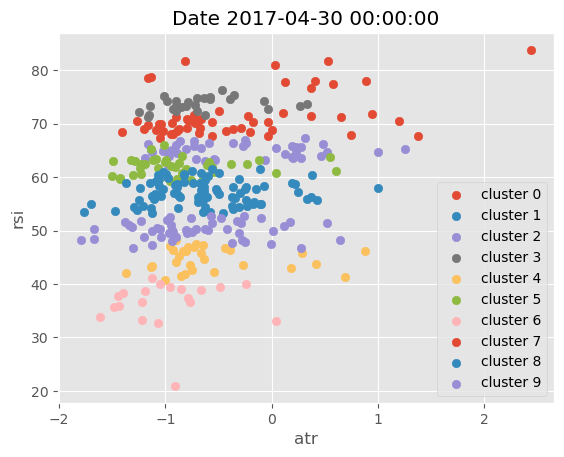

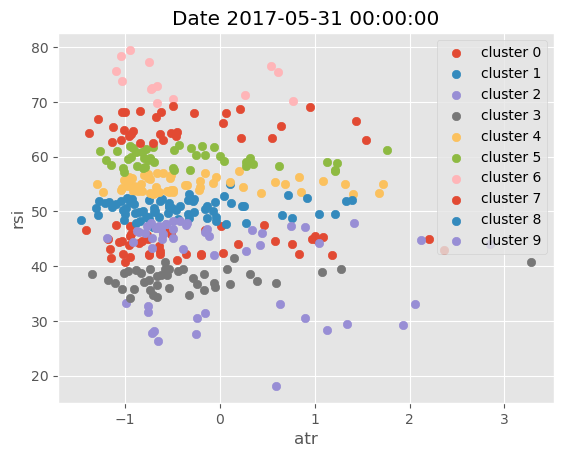

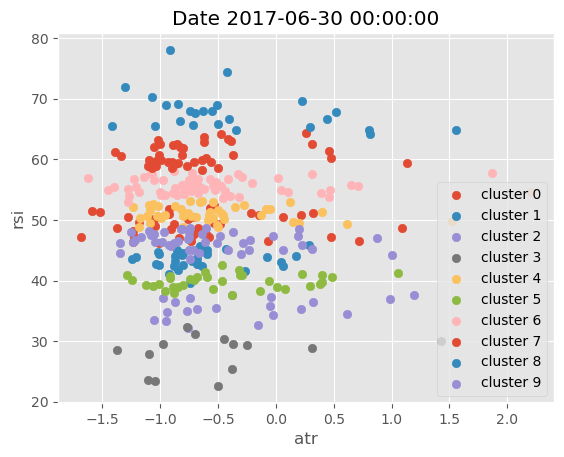

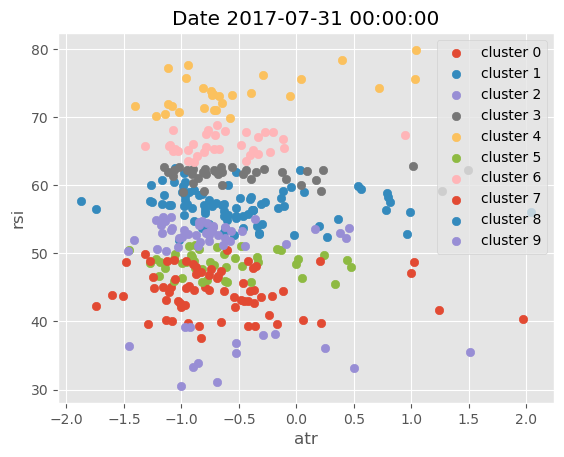

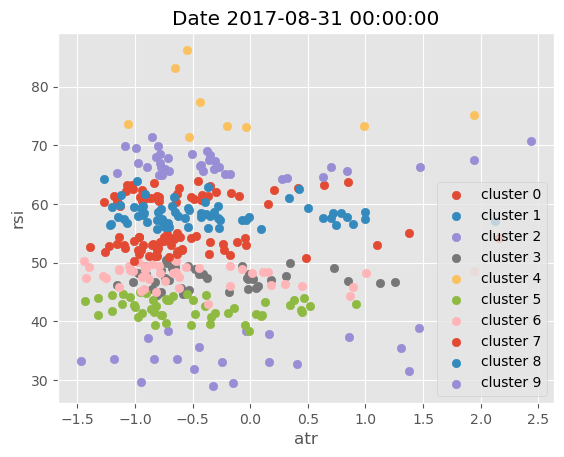

...

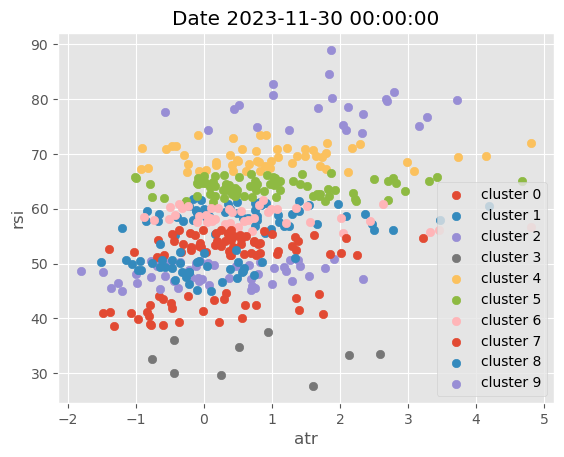

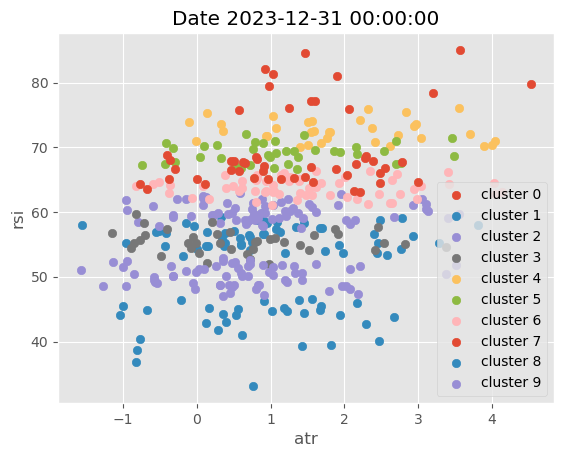

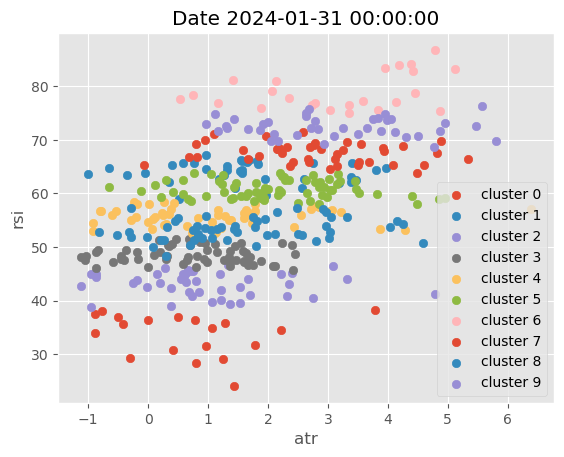

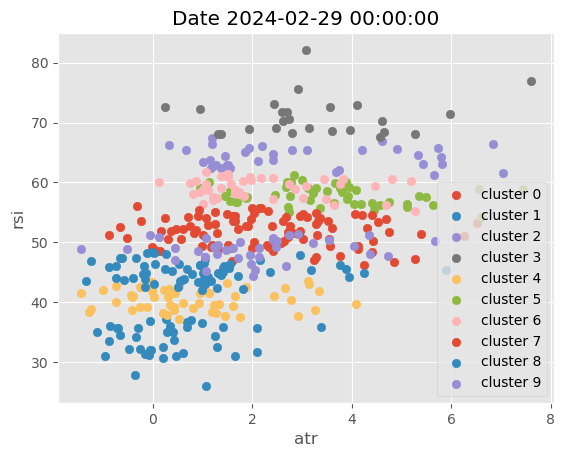

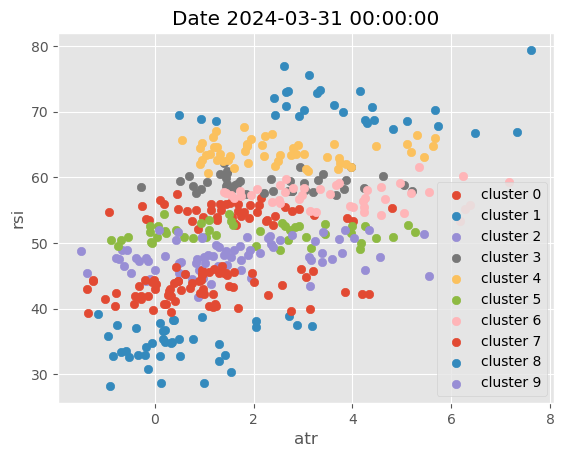

In [15]:
plt.style.use('ggplot')

for i in data.index.get_level_values('date').unique().tolist():
    
    g = data.xs(i, level=0)
    
    plt.title(f'Date {i}')
    
    plot_clusters(g)

##  Apply pre-defined Centriods

In [16]:
target_rsi_values = [30,35,40,45,55,60,65,70,75,80]

initial_centroids = np.zeros((len(target_rsi_values), 18))

initial_centroids[:, 1] = target_rsi_values

initial_centroids

array([[ 0., 30.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.],
       [ 0., 35.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.],
       [ 0., 40.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.],
       [ 0., 45.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.],
       [ 0., 55.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.],
       [ 0., 60.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.],
       [ 0., 65.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.],
       [ 0., 70.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.],
       [ 0., 75.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.],
       [ 0., 80.,  0.,  0.,  0.,  0.,

In [17]:
 

data = data.drop('cluster', axis=1)

def get_clusters(df):
    df['cluster'] = KMeans(n_clusters=10,
                           random_state=0,
                           init=initial_centroids).fit(df).labels_
    return df

data = data.dropna().groupby('date', group_keys=False).apply(get_clusters)

data

garman_klass_vol        rsi    bb_low    bb_mid  \
date       ticker                                                           
2017-04-30 3MINDIA.NS            -0.000661  48.441048  9.294411  9.335754   
           AARTIDRUGS.NS          0.001436  42.679175  4.936431  4.962417   
           AARTIIND.NS            0.000134  73.359193  5.175510  5.247757   
           ABB.NS                 0.000089  65.491077  7.027148  7.111245   
           ABBOTINDIA.NS         -0.000215  41.070968  8.342477  8.399642   
...                                    ...        ...       ...       ...   
2024-03-31 ZEEL.NS                0.000766  36.550147  5.046466  5.190669   
           ZENSARTECH.NS          0.000312  47.956963  6.227294  6.303624   
           ZFCVINDIA.NS           0.000264  45.660255  9.551111  9.596274   
           ZYDUSLIFE.NS           0.000117  75.600481  6.644969  6.774442   
           ZYDUSWELL.NS           0.000077  42.379249  7.351581  7.373139   

                           bb_high       atr      macd  return_1m  return_2m  \
date       ticker                                                              
2017-04-30 3MINDIA.NS     9.377096 -1.674053 -0.080166  -0.005865   0.014887   
           AARTIDRUGS.NS  4.988404 -0.746091 -0.128798  -0.013457  -0.027187   
           AARTIIND.NS    5.320004 -1.138944  0.199704   0.146627   0.065393   
           ABB.NS         7.195343 -0.659398  0.592034   0.104754   0.086316   
           ABBOTINDIA.NS  8.456806 -1.121664 -0.499902  -0.047075  -0.004373   
...                            ...       ...       ...        ...        ...   
2024-03-31 ZEEL.NS        5.334872  0.172328 -1.451756  -0.035104  -0.052810   
           ZENSARTECH.NS  6.379954  1.176663 -0.851322  -0.009552  -0.024659   
           ZFCVINDIA.NS   9.641437  3.207386 -2.398859   0.020910  -0.047297   
           ZYDUSLIFE.NS   6.903915  3.112305  4.827154  -0.017571   0.102853   
           ZYDUSWELL.NS   7.394696 -0.790893 -0.461478  -0.001021  -0.034902   

                          return_3m  return_6m  return_9m  return_12m  \
date       ticker                                                       
2017-04-30 3MINDIA.NS     -0.012928  -0.020460  -0.024970   -0.012195   
           AARTIDRUGS.NS  -0.028404  -0.027350   0.007901    0.015831   
           AARTIIND.NS     0.069128   0.024983   0.052259    0.042606   
           ABB.NS          0.088688   0.044469   0.012474    0.007202   
           ABBOTINDIA.NS   0.001690  -0.020145  -0.005912   -0.003176   
...                             ...        ...        ...         ...   
2024-03-31 ZEEL.NS        -0.173129  -0.084952  -0.014644   -0.025698   
           ZENSARTECH.NS  -0.036451   0.009093   0.039937    0.059744   
           ZFCVINDIA.NS   -0.025184  -0.007903   0.022382    0.030018   
           ZYDUSLIFE.NS    0.103198   0.070463   0.053748    0.054947   
           ZYDUSWELL.NS    0.003063  -0.007929   0.008424    0.007946   

                            Mkt-RF       SMB       HML       RMW       CMA  \
date       ticker                                                            
2017-04-30 3MINDIA.NS     0.393866  0.034060  0.338306  0.608172 -0.360598   
           AARTIDRUGS.NS  0.471733  0.700200 -0.805368  2.084083  0.231625   
           AARTIIND.NS    0.679772 -0.941624  0.634940 -0.687629 -0.597731   
           ABB.NS         0.722502 -0.319401  0.598970 -0.731891  0.131534   
           ABBOTINDIA.NS  0.000085  0.534202 -0.186110  0.969013 -0.050999   
...                            ...       ...       ...       ...       ...   
2024-03-31 ZEEL.NS        0.654588  0.366382  0.330074 -0.624075  0.090968   
           ZENSARTECH.NS  0.508775  0.789471  0.339987 -0.413999 -0.804105   
           ZFCVINDIA.NS  -0.157068  0.213918  0.820361  0.199942 -1.416470   
           ZYDUSLIFE.NS   0.520294 -0.339626  0.373605 -1.144873  0.307670   
           ZYDUSWELL.NS  -0.165923  0.309853  0.031921  0.797783 -0.128238   

                  

In [18]:
# def plot_clusters(data):

#     cluster_0 = data[data['cluster']==0]
#     cluster_1 = data[data['cluster']==1]
#     cluster_2 = data[data['cluster']==2]
#     cluster_3 = data[data['cluster']==3]

#     plt.scatter(cluster_0.iloc[:,5] , cluster_0.iloc[:,1] , color = 'red', label='cluster 0')
#     plt.scatter(cluster_1.iloc[:,5] , cluster_1.iloc[:,1] , color = 'green', label='cluster 1')
#     plt.scatter(cluster_2.iloc[:,5] , cluster_2.iloc[:,1] , color = 'blue', label='cluster 2')
#     plt.scatter(cluster_3.iloc[:,5] , cluster_3.iloc[:,1] , color = 'black', label='cluster 3')

#     plt.legend()
#     plt.show()
#     return
import matplotlib.pyplot as plt

def plot_clusters(data, num_clusters=10):
    # Iterate over clusters
    for cluster_num in range(num_clusters):
        cluster_data = data[data['cluster'] == cluster_num]
        # Scatter plot for each cluster
        plt.scatter(cluster_data.iloc[:, 5], cluster_data.iloc[:, 1], label=f'cluster {cluster_num}')

    # Labeling
    x_label = data.columns[5]
    y_label = data.columns[1]
    plt.title(f'Clusters based on {x_label} and {y_label}')
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.legend()
    plt.show()

# Example usage with 4 clusters
# Replace data and 'cluster' with your actual DataFrame and cluster column name
# plot_clusters(your_data_frame, num_clusters=4)


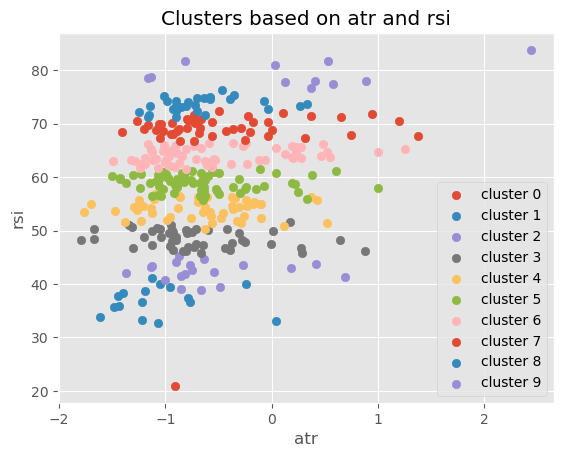

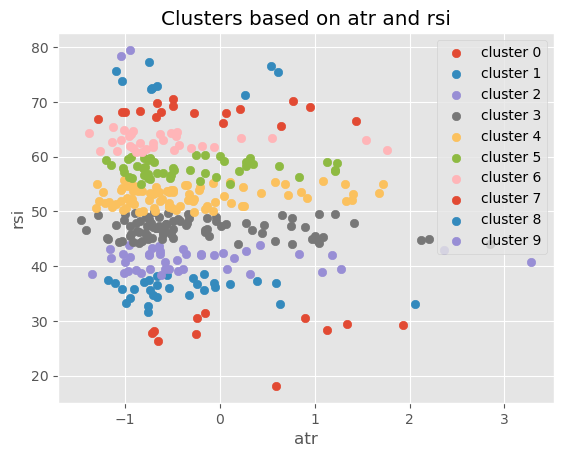

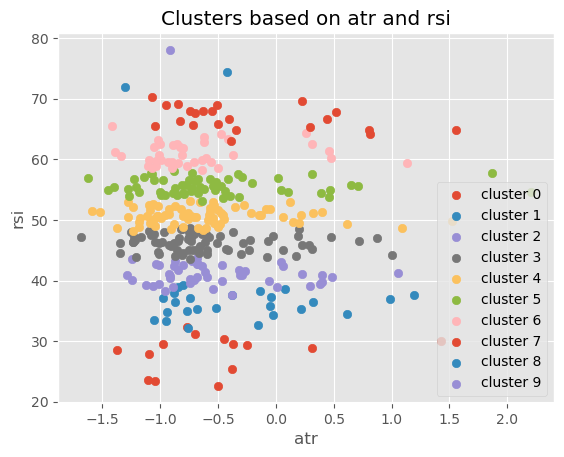

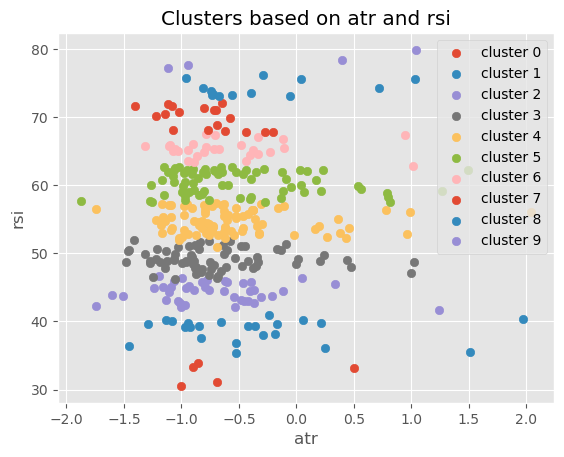

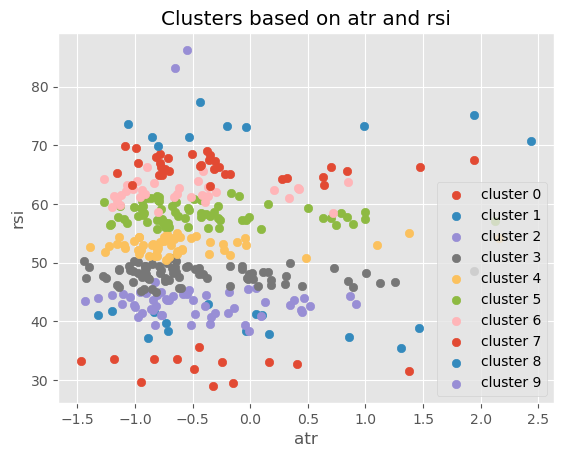

...

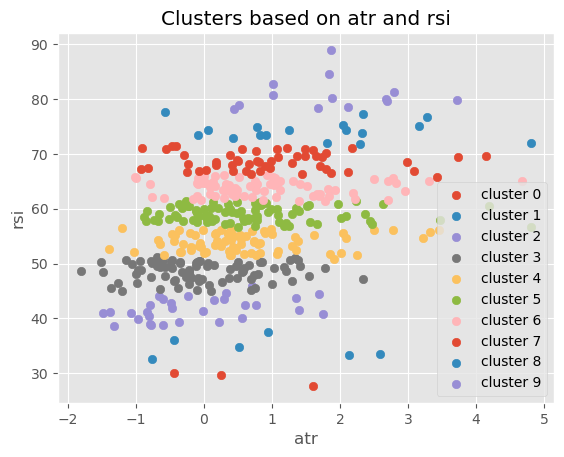

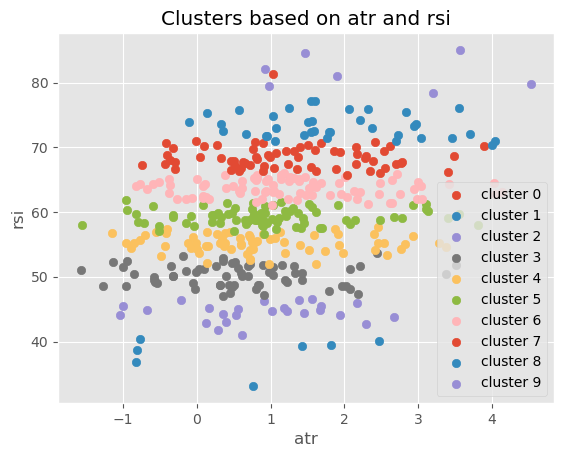

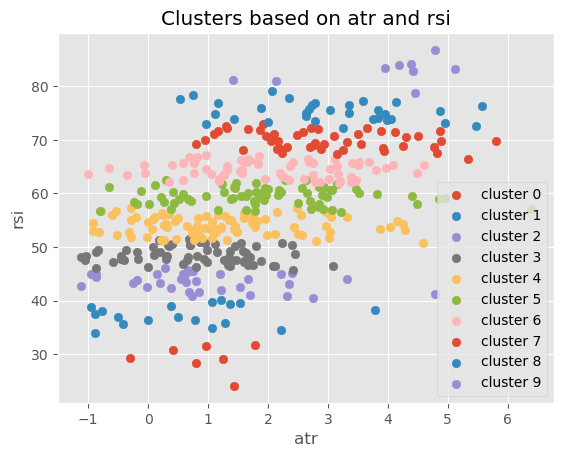

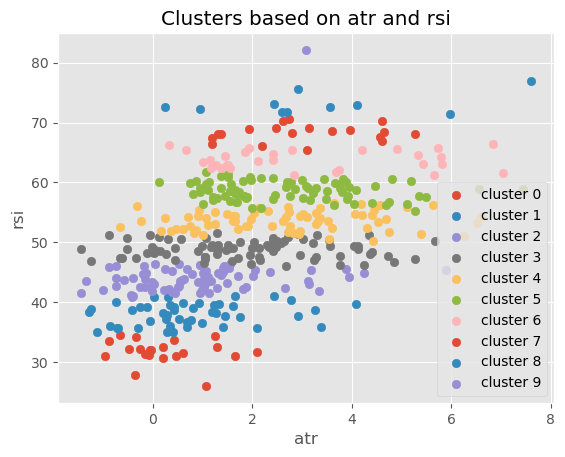

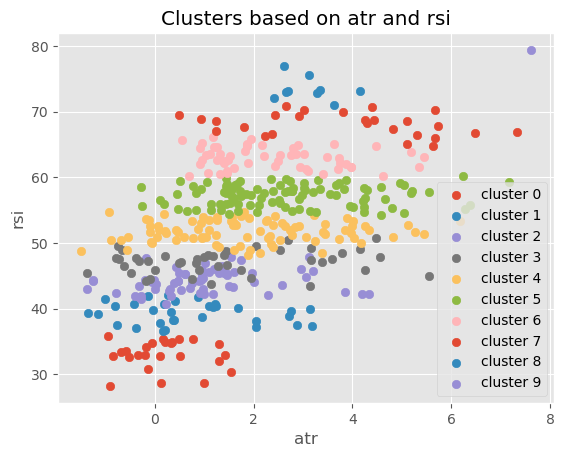

In [19]:
plt.style.use('ggplot')

for i in data.index.get_level_values('date').unique().tolist():
    
    g = data.xs(i, level=0)
    
    plt.title(f'Date {i}')
    
    plot_clusters(g)

In [20]:
target_rsi_values = [30,35,40,45,55,60,65,70,75,80]

initial_centroids = np.zeros((len(target_rsi_values), 18))

initial_centroids[:, 1] = target_rsi_values

initial_centroids

array([[ 0., 30.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.],
       [ 0., 35.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.],
       [ 0., 40.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.],
       [ 0., 45.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.],
       [ 0., 55.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.],
       [ 0., 60.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.],
       [ 0., 65.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.],
       [ 0., 70.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.],
       [ 0., 75.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.],
       [ 0., 80.,  0.,  0.,  0.,  0.,

# 7. For each month select assets based on the cluster and form a portfolio based on Efficient Frontier max sharpe ratio optimization
* First we will filter only stocks corresponding to the cluster we choose based on our hypothesis.

* Momentum is persistent and my idea would be that stocks clustered around RSI 70 centroid should continue to outperform in the following month - thus I would select stocks corresponding to cluster 3.

In [21]:
import pandas as pd
import yfinance as yf

# Your previous code to filter DataFrame and create 'fixed_dates' dictionary
filtered_df = data[data['cluster'] == 8].copy()  # Make sure to use the correct cluster value
filtered_df = filtered_df.reset_index(level=1)
filtered_df.index = filtered_df.index + pd.DateOffset(1)
filtered_df = filtered_df.reset_index().set_index(['date', 'ticker'])
dates = filtered_df.index.get_level_values('date').unique().tolist()
fixed_dates = {}

for d in dates:
    fixed_dates[f"'{d.strftime('%Y-%m-%d')}'"] = filtered_df.xs(d, level=0).index.tolist()
fixed_dates   

# # Write the output to a text file
# with open('Cluster9_new_output.txt', 'w') as f:
#     for key, value in fixed_dates.items():
#         f.write(f"{key}: {value},\n")



{"'2017-05-01'": ['AARTIIND.NS',
  'ACC.NS',
  'BAYERCROP.NS',
  'BBTC.NS',
  'BIRLACORPN.NS',
  'BRITANNIA.NS',
  'CANFINHOME.NS',
  'CESC.NS',
  'CHAMBLFERT.NS',
  'CONCOR.NS',
  'CYIENT.NS',
  'DCMSHRIRAM.NS',
  'FACT.NS',
  'HDFCBANK.NS',
  'HEG.NS',
  'KEI.NS',
  'LICHSGFIN.NS',
  'LT.NS',
  'LUXIND.NS',
  'MASTEK.NS',
  'MRF.NS',
  'PNCINFRA.NS',
  'POLYPLEX.NS',
  'PRSMJOHNSN.NS',
  'RAJESHEXPO.NS',
  'SHREECEM.NS',
  'SKFINDIA.NS',
  'TATACHEM.NS'],
 "'2017-06-01'": ['AVANTIFEED.NS',
  'BIRLACORPN.NS',
  'ESCORTS.NS',
  'HEROMOTOCO.NS',
  'HINDUNILVR.NS',
  'JKCEMENT.NS',
  'MARUTI.NS',
  'RAJESHEXPO.NS',
  'SUPRAJIT.NS'],
 "'2017-07-01'": ['GILLETTE.NS', 'TEAMLEASE.NS'],
 "'2017-08-01'": ['ASAHIINDIA.NS',
  'BAJAJFINSV.NS',
  'BAJAJHLDNG.NS',
  'BEML.NS',
  'DEEPAKFERT.NS',
  'GRAPHITE.NS',
  'INDUSINDBK.NS',
  'INFIBEAM.NS',
  'LAXMIMACH.NS',
  'TATAINVEST.NS',
  'UNOMINDA.NS',
  'WELCORP.NS',
  'YESBANK.NS'],
 "'2017-09-01'": ['ASAHIINDIA.NS',
  'BAJAJHLDNG.NS',
  'BBTC.NS',

# Define portfolio optimization function
* We will define a function which optimizes portfolio weights using PyPortfolioOpt package and EfficientFrontier optimizer to maximize the sharpe ratio.

* To optimize the weights of a given portfolio we would need to supply last 1 year prices to the function.

* Apply signle stock weight bounds constraint for diversification (minimum half of equaly weight and maximum 10% of portfolio).

In [22]:
from pypfopt.efficient_frontier import EfficientFrontier
from pypfopt import risk_models
from pypfopt import expected_returns

def optimize_weights(prices, lower_bound=0):
    
    returns = expected_returns.mean_historical_return(prices=prices,
                                                      frequency=252)
    
    cov = risk_models.sample_cov(prices=prices,
                                 frequency=252)
    
    ef = EfficientFrontier(expected_returns=returns,
                           cov_matrix=cov,
                           weight_bounds=(lower_bound, .1),
                           solver='SCS')
    
    weights = ef.max_sharpe()
    
    return ef.clean_weights()

In [23]:
stocks = data.index.get_level_values('ticker').unique().tolist()
new_df= yf.download(tickers= stocks,
                    start=data.index.get_level_values('date').unique()[0]-pd.DateOffset(months=12)
                    ,end=data.index.get_level_values('date').unique()[-1])
new_df

[*********************100%%**********************]  444 of 444 completed


Adj Close                                                       \
             360ONE.NS    3MINDIA.NS AARTIDRUGS.NS AARTIIND.NS     AAVAS.NS   
Date                                                                          
2016-05-02         NaN  13002.675781    112.405357  127.784836          NaN   
2016-05-03         NaN  12852.421875    115.152924  126.160530          NaN   
2016-05-04         NaN  12693.897461    114.147125  126.551788          NaN   
2016-05-05         NaN  12627.353516    119.531883  125.057915          NaN   
2016-05-06         NaN  12696.158203    113.938591  125.828560          NaN   
...                ...           ...           ...         ...          ...   
2024-03-21  670.393921  30049.250000    447.500000  648.500000  1349.199951   
2024-03-22  662.877625  30728.400391    455.600006  655.299988  1356.099976   
2024-03-26  647.397034  30487.150391    443.200012  656.500000  1325.150024   
2024-03-27  664.968262  31475.099609    440.799988  658.250000  1323.400024   
2024-03-28  672.584106  31193.349609    434.299988  665.549988  1315.650024   

                                                                             \
                 ABB.NS ABBOTINDIA.NS ABCAPITAL.NS    ABFRL.NS       ACC.NS   
Date                                                                          
2016-05-02  1119.622314   4362.705078          NaN  143.321838  1298.621338   
2016-05-03  1094.467407   4431.698730          NaN  139.871857  1298.255981   
2016-05-04  1081.581055   4476.694824          NaN  138.935440  1283.217651   
2016-05-05  1094.908813   4432.079590          NaN  137.654022  1275.127441   
2016-05-06  1098.571655   4446.268066          NaN  140.561859  1303.100830   
...                 ...           ...          ...         ...          ...   
2024-03-21  5844.011719  27673.250000   173.449997  206.350006  2438.850098   
2024-03-22  5946.146484  27067.099609   175.050003  205.350006  2443.250000   
2024-03-26  5908.680664  26701.050781   177.100006  207.000000  2450.000000   
2024-03-27  6256.985840  26711.050781   175.550003  204.949997  2454.100098   
2024-03-28  6338.195801  27120.800781   175.399994  205.550003  2491.699951   

            ...        Volume                                                \
            ... WELSPUNLIV.NS WESTLIFE.NS WHIRLPOOL.NS  WIPRO.NS YESBANK.NS   
Date        ...                                                               
2016-05-02  ...       1118876         NaN        45945   2648204   19933955   
2016-05-03  ...        526563         NaN        11942   4605201   14613445   
2016-05-04  ...        730136         NaN        50565   3498556   24070805   
2016-05-05  ...        496333         NaN        52193   2912359   33803715   
2016-05-06  ...        436816         NaN        53059   3435209   11919815   
...         ...           ...         ...          ...       ...        ...   
2024-03-21  ...       1511414     57780.0        86229   5822290  176412547   
2024-03-22  ...       3496196     40324.0       116366  14323251  261281861   
2024-03-26  ...       1330446     46669.0       142003   9136673  214847555   
2024-03-27  ...       1725832     75203.0       242116   7160334  181249947   
2024-03-28  ...       1875865    181917.0        99525   7727575  189198317   

                                                                           
             ZEEL.NS ZENSARTECH.NS ZFCVINDIA.NS ZYDUSLIFE.NS ZYDUSWELL.NS  
Date                                                                       
2016-05-02   1406101         37215         3250       328278       1992.0  
2016-05-03   1808007        153605         3712       729721       1581.0  
2016-05-04   1440825        563155         3308       453894       1719.0  
2016-05-05   2185694        133365         5888       491454       4215.0  
2016-05-06    873252         69985         2389       573580       1177.0  
...              ...           ...          ...          ...          ...  
2024-03-

In [24]:
data.index.get_level_values('date').unique()[0]-pd.DateOffset(months=12)

Timestamp('2016-04-30 00:00:00')

* Calculate daily returns for each stock which could land up in our portfolio.

* Then loop over each month start, select the stocks for the month and calculate their weights for the next month.

* If the maximum sharpe ratio optimization fails for a given month, apply equally-weighted weights.

* Calculated each day portfolio return.

In [25]:
import cvxpy as cp
import pandas as pd
import numpy as np

# Assuming you have the optimize_weights function defined

returns_dataframe = np.log(new_df['Adj Close']).diff()
portfolio_df = pd.DataFrame()

for start_date in fixed_dates.keys():
    try:
        end_date = (pd.to_datetime(start_date) + pd.offsets.MonthEnd(0)).strftime('%Y-%m-%d')
        cols = fixed_dates[start_date]
        optimization_start_date = (pd.to_datetime(start_date) - pd.DateOffset(months=12)).strftime('%Y-%m-%d')
        optimization_end_date = (pd.to_datetime(start_date) - pd.DateOffset(days=1)).strftime('%Y-%m-%d')
        
        optimization_df = new_df[optimization_start_date:optimization_end_date]['Adj Close'][cols]
        
        success = False
        try:
            weights = optimize_weights(prices=optimization_df,
                                       lower_bound=round(1/(len(optimization_df.columns)*2), 3))

            weights = pd.DataFrame(weights, index=pd.Series(0))
            success = True
        except Exception as e:
            print(f'Max Sharpe Optimization failed for {start_date}, Continuing with Equal-Weights. Error: {e}')

        if not success:
            weights = pd.DataFrame([1/len(optimization_df.columns) for _ in range(len(optimization_df.columns))],
                                    index=optimization_df.columns.tolist(),
                                    columns=pd.Series(0)).T
        
        temp_df = returns_dataframe[start_date:end_date]

        # Merge with weights using the 'Date' and 'index' columns
        temp_df = temp_df.merge(weights, left_index=True, right_index=True, how='left')

        # Calculate the weighted return for each asset
        temp_df['weighted_return'] = temp_df['return'] * temp_df[0]

        # Calculate the total strategy return for each date
        strategy_return = temp_df.groupby(level=0)['weighted_return'].sum().to_frame('Strategy Return')

        portfolio_df = pd.concat([portfolio_df, strategy_return], axis=0)
    
    except Exception as e:
        print(f'Error processing {start_date}: {e}')

# Reset the index to 'date' and 'ticker'
portfolio_df.reset_index(inplace=True)

# Drop duplicates based on 'date' and 'ticker'
portfolio_df = portfolio_df.drop_duplicates(subset=['date', 'ticker'])

# Ensure 'Date' is in datetime format
portfolio_df['date'] = pd.to_datetime(portfolio_df['date'])

# Display the resulting DataFrame
print(portfolio_df)



Error processing '2017-05-01': 'return'
Max Sharpe Optimization failed for '2017-06-01', Continuing with Equal-Weights. Error: ('Please check your objectives/constraints or use a different solver.', 'Solver status: infeasible')
Error processing '2017-06-01': 'return'
Max Sharpe Optimization failed for '2017-07-01', Continuing with Equal-Weights. Error: ('Please check your objectives/constraints or use a different solver.', 'Solver status: infeasible')
Error processing '2017-07-01': 'return'
Error processing '2017-08-01': 'return'
Error processing '2017-09-01': 'return'
Max Sharpe Optimization failed for '2017-10-01', Continuing with Equal-Weights. Error: ('Please check your objectives/constraints or use a different solver.', 'Solver status: infeasible')
Error processing '2017-10-01': 'return'
Error processing '2017-11-01': 'return'
Error processing '2017-12-01': 'return'
Error processing '2018-01-01': 'return'
Max Sharpe Optimization failed for '2018-02-01', Continuing with Equal-Weigh

Error processing '2022-08-01': 'return'
Error processing '2022-09-01': 'return'
Error processing '2022-10-01': 'return'
Error processing '2022-11-01': 'return'
Error processing '2022-12-01': 'return'
Max Sharpe Optimization failed for '2023-01-01', Continuing with Equal-Weights. Error: ('Please check your objectives/constraints or use a different solver.', 'Solver status: infeasible')
Error processing '2023-01-01': 'return'
Max Sharpe Optimization failed for '2023-02-01', Continuing with Equal-Weights. Error: ('Please check your objectives/constraints or use a different solver.', 'Solver status: infeasible')
Error processing '2023-02-01': 'return'
Max Sharpe Optimization failed for '2023-03-01', Continuing with Equal-Weights. Error: ('Please check your objectives/constraints or use a different solver.', 'Solver status: infeasible')
Error processing '2023-03-01': 'return'
Error processing '2023-04-01': 'return'
Max Sharpe Optimization failed for '2023-05-01', Continuing with Equal-Weigh

KeyError: 'date'

In [ ]:
returns_dataframe = np.log(new_df['Adj Close']).diff()

portfolio_df = pd.DataFrame()

for start_date in fixed_dates.keys():
    
    try:

        end_date = (pd.to_datetime(start_date)+pd.offsets.MonthEnd(0)).strftime('%Y-%m-%d')

        cols = fixed_dates[start_date]

        optimization_start_date = (pd.to_datetime(start_date)-pd.DateOffset(months=12)).strftime('%Y-%m-%d')

        optimization_end_date = (pd.to_datetime(start_date)-pd.DateOffset(days=1)).strftime('%Y-%m-%d')
        
        optimization_df = new_df[optimization_start_date:optimization_end_date]['Adj Close'][cols]
        
        success = False
        try:
            weights = optimize_weights(prices=optimization_df,
                                   lower_bound=round(1/(len(optimization_df.columns)*2),3))

            weights = pd.DataFrame(weights, index=pd.Series(0))
            
            success = True
        except:
            print(f'Max Sharpe Optimization failed for {start_date}, Continuing with Equal-Weights')
        
        if success==False:
            weights = pd.DataFrame([1/len(optimization_df.columns) for i in range(len(optimization_df.columns))],
                                     index=optimization_df.columns.tolist(),
                                     columns=pd.Series(0)).T
        
        temp_df = returns_dataframe[start_date:end_date]

        temp_df = temp_df.stack().to_frame('return').reset_index(level=0)\
                   .merge(weights.stack().to_frame('weight').reset_index(level=0, drop=True),
                          left_index=True,
                          right_index=True)\
                   .reset_index().set_index(['Date', 'index']).unstack().stack()

        temp_df.index.names = ['date', 'ticker']

        temp_df['weighted_return'] = temp_df['return']*temp_df['weight']

        temp_df = temp_df.groupby(level=0)['weighted_return'].sum().to_frame('Strategy Return')

        portfolio_df = pd.concat([portfolio_df, atemp_df], axis=0)
    
    except Exception as e:
        print(e)

portfolio_df = portfolio_df.drop_duplicates()

portfolio_df
    

In [ ]:
portfolio_df.index = pd.to_datetime(portfolio_df.index)

In [ ]:
portfolio_df.plot()

In [ ]:
pd.DataFrame([1/len(optimization_df.columns) for i in range(len(optimization_df.columns))],
                                     index=optimization_df.columns.tolist(),
                                     columns=pd.Series(0)).T

In [ ]:
nifty = yf.download(tickers='^NSEI',
                  start='2015-01-01',
                  end=dt.date.today())

nifty_ret = np.log(nifty[['Adj Close']]).diff().dropna().rename({'Adj Close':'nifty Buy&Hold'}, axis=1)

portfolio_df = portfolio_df.merge(nifty_ret,
                                  left_index=True,
                                  right_index=True)

portfolio_df

In [ ]:
import matplotlib.ticker as mtick
unique_clusters = data['cluster'].unique()

for cluster_number in unique_clusters:
    filtered_df = data[data['cluster'] == cluster_number].copy()

plt.style.use('ggplot')

portfolio_cumulative_return = np.exp(np.log1p(portfolio_df).cumsum())-1

portfolio_cumulative_return[:'2023-09-29'].plot(figsize=(16,6))

plt.title('Unsupervised Learning Trading Strategy Returns Over Time for cluster ')

plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(1))

plt.ylabel('Return')

plt.show()




In [ ]:
import numpy as np

# Assuming 'portfolio_df' has the 'Strategy Return' and 'nifty Buy&Hold' columns
strategy_returns = portfolio_df['Strategy Return']
nifty_returns = portfolio_df['nifty Buy&Hold']

# Calculate Sharpe ratio for the strategy
strategy_sharpe_ratio = np.sqrt(252) * strategy_returns.mean() / strategy_returns.std()

# Calculate Sharpe ratio for NIFTY 50
nifty_sharpe_ratio = np.sqrt(252) * nifty_returns.mean() / nifty_returns.std()

# Print the Sharpe Ratios
print(f"Strategy Sharpe Ratio: {strategy_sharpe_ratio:.4f}")
print(f"NIFTY 50 Sharpe Ratio: {nifty_sharpe_ratio:.4f}")


In [ ]:
# Given data
stock_data = {
    'BAJFINANCE': [7259.35, 7314.55, 0.760399],
    'ICICIBANK': [946.70, 1015.70, 7.28848],
    'INDUSINDBK': [1461.15, 1497.50, 2.48777],
    'ITC': [449.90, 453.10, 0.711269],
    'KOTAKBANK': [1750.50, 1824.35, 4.21879],
    'SBIN': [571.75, 612.40, 7.10975],
    'ASIANPAINT': [3173.40, 3243.65, 2.21371],
    'CIPLA': [1205.70, 1216.50, 0.895745],
    'TCS': [3511.65, 3593.55, 2.33224],
    'UPL': [575.15, 599.35, 4.2076]
}

# Calculating total increase
total_increase = sum(stock[2] for stock in stock_data.values())

# Displaying the total increase
print(f'Total Increase: {total_increase:.2f}%')

In [ ]:
apar= yf.download('APARINDS.NS',start="2010-01-01",end="2024-02-01")